# Process Maritime Museum Images

In [1]:
#Resize and rename Museum Maritime images
from PIL import Image
import glob

# empty list
image_list = []
resized_images = []

# append image to list
for filename in glob.glob('D:/Datasets/raw/Maritime_raw/*.jpg'):
    img = Image.open(filename)
    image_list.append(img)

# append resized images to list
for image in image_list:
    image = image.resize((100,100))
    resized_images.append(image)

# save resized images to a new folder called Museum
for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('D:/Datasets/Museum/1_',i+1,'.jpg'))


# Process Melaka UMNO Museum Images

In [2]:
from PIL import Image
import glob

# empty list
image_list = []
resized_images = []

# append image to list
for filename in glob.glob('D:/Datasets/raw/UMNO_raw/*.jpg'):
    img = Image.open(filename)
    image_list.append(img)

# append resized images to list
for image in image_list:
    image = image.resize((100,100))
    resized_images.append(image)

# save resized images to a new folder called Museum
for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('D:/Datasets/Museum/2_',i+1,'.jpg'))


# Process Malaysia Youth Museum Image

In [3]:
from PIL import Image
import glob

# empty list
image_list = []
resized_images = []

# append image to list
for filename in glob.glob('D:/Datasets/raw/Youth_raw/*.jpg'):
    img = Image.open(filename)
    image_list.append(img)

# append resized images to list
for image in image_list:
    image = image.resize((100,100))
    resized_images.append(image)

# save resized images to new folder
# could also probably use os to create new folder
for (i, new) in enumerate(resized_images):
    new.save('{}{}{}'.format('D:/Datasets/Museum/3_',i+1,'.jpg'))


# Read Images Using OpenCV

In [4]:
import glob
from PIL import Image
import numpy as np
import cv2

# Import images from training set
train_images = []


for f in glob.iglob("D:/Datasets/Museum/*.jpg"):
    image = cv2.imread(f)
    train_images.append(np.asarray(image))
    
train_images = np.array(train_images)
print(train_images)

[[[[ 26  24  23]
   [ 26  24  23]
   [ 26  24  23]
   ...
   [ 15  16  14]
   [ 15  16  14]
   [ 15  16  14]]

  [[ 25  23  22]
   [ 25  23  22]
   [ 25  23  22]
   ...
   [ 16  17  15]
   [ 16  17  15]
   [ 16  17  15]]

  [[ 24  22  21]
   [ 24  22  21]
   [ 24  22  21]
   ...
   [ 17  18  16]
   [ 17  18  16]
   [ 17  18  16]]

  ...

  [[ 45  37  24]
   [ 37  34  26]
   [ 30  32  32]
   ...
   [ 51 134 196]
   [ 84 169 231]
   [ 77 165 225]]

  [[ 43  35  28]
   [ 38  33  30]
   [ 32  32  38]
   ...
   [ 62 144 199]
   [ 92 178 232]
   [ 98 186 240]]

  [[ 41  32  28]
   [ 36  31  30]
   [ 29  30  40]
   ...
   [  0  34  87]
   [ 67 152 202]
   [132 219 255]]]


 [[[180 116  52]
   [180 116  52]
   [180 115  54]
   ...
   [183 119  64]
   [183 119  64]
   [184 120  65]]

  [[180 116  52]
   [180 116  52]
   [180 115  54]
   ...
   [185 121  66]
   [185 121  66]
   [185 121  66]]

  [[180 115  54]
   [180 115  54]
   [180 115  54]
   ...
   [186 122  67]
   [186 122  67]
   [186 122

In [5]:
#printing out its shape
#There are 90 images with 100*100 pixels, 3 means RGB(colour)
print(train_images.shape)

(90, 100, 100, 3)


# Save Image Data To Text File

In [6]:
#we saved the image that read by using opencv2 so future use
np.savetxt("D:/Datasets/musuem_train_data_with_colour.txt", train_images.reshape(90, 30000))

# Load Image Data From Text File

In [7]:
train_folder="D:/Datasets/musuem_train_data_with_colour.txt"
X_train = np.loadtxt(train_folder)
print("Shape of training set: {}".format(X_train.shape))

Shape of training set: (90, 30000)


# Plot Back The Data

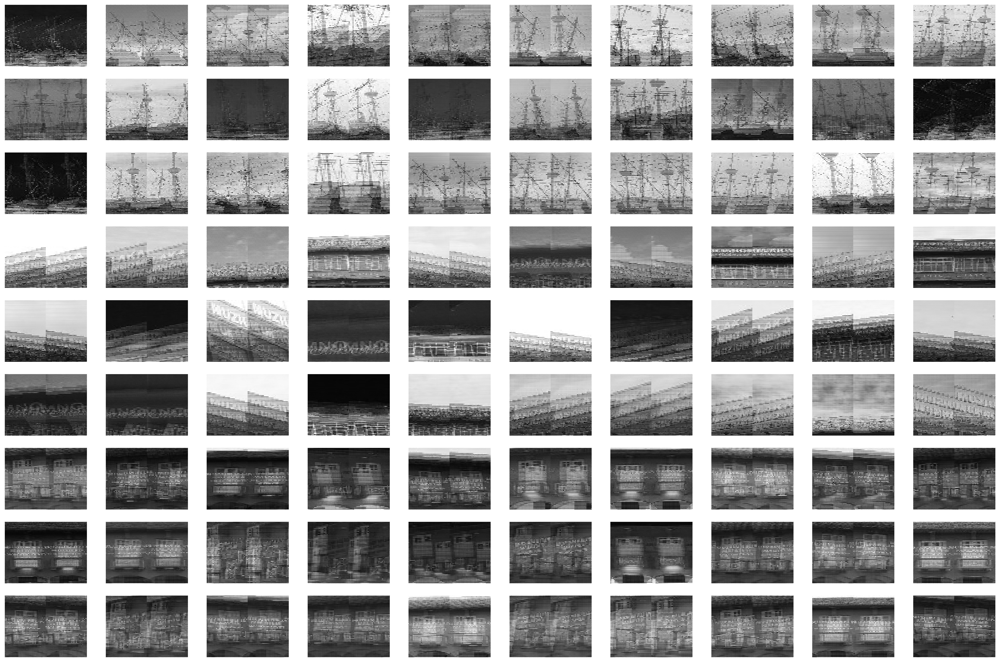

In [8]:
def image_grid(D,H,W,cols=10,scale=1):
    """ display a grid of images
        H,W: Height and width of the images
        cols: number of columns = number of images in each row
        scale: 1 to fill screen
    """
    n = np.shape(D)[0]
    rows = int(math.ceil((n+0.0)/cols))
    fig = plt.figure(1,figsize=[scale*20.0/H*W,scale*20.0/cols*rows],dpi=300)
    for i in range(n):
        plt.subplot(rows,cols,i+1)
        fig=plt.imshow(np.reshape(D[i,:],[H,W]), cmap = plt.get_cmap("gray"))
        plt.axis('off')
        
H = 150
W = 200

import math
import matplotlib.pyplot as plt
%matplotlib inline

# Show training images
image_grid(X_train, H, W)
plt.show()

# Find Mean Image

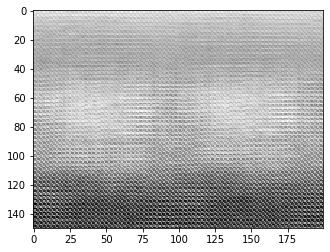

In [9]:
# Find the mean image
import matplotlib.pyplot as plt
mean_image = np.mean(X_train, axis = 0)

plt.imshow(np.reshape(mean_image, [H, W]), cmap = plt.get_cmap("gray"))

# Split Data Before PCA

In [10]:
from sklearn.model_selection import train_test_split

target = np.array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                   1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 
                   2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])
#check the size of target to be 90 before saving it to txt file for future use
print(target.shape)

np.savetxt("D:/Datasets/musuem_y_label.txt", target)

X_train, X_test, y_train, y_test = train_test_split(X_train, target, random_state=42)

# X is data.
# y is label.
# Random state is 42 to ensure it is constant set to be taken.

(90,)


# PCA (Feature Extraction)

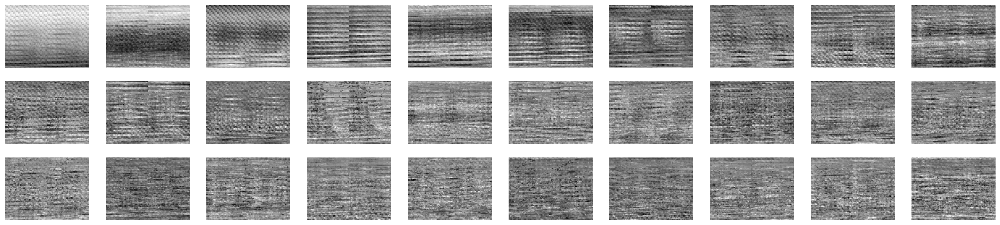

In [11]:
from sklearn.decomposition import PCA
n_components = 30

# Extracting the top 30 eigenfaces from the dataset
pca = PCA(n_components=n_components, svd_solver='randomized',
          whiten=True).fit(X_train)

# Showing the eigenfaces
eigenfaces = pca.components_
image_grid(eigenfaces[:,:], H, W)
plt.show()

# PCA the largest eigenbasis has more information (lower noise)
# It is unclear as the image go down


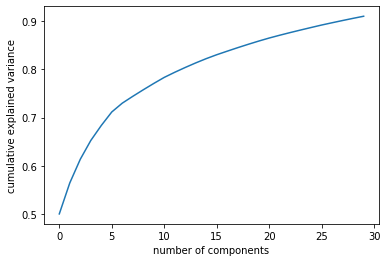

In [12]:
#reshape eigenfaces
eigenfaces = eigenfaces.reshape((n_components, H, W))

#apply pca to reduce dimension of our image data
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

# plot the graph to find the best number of component
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance');
plt.show()


# Calculate Intra-Class and Inter-Class distance

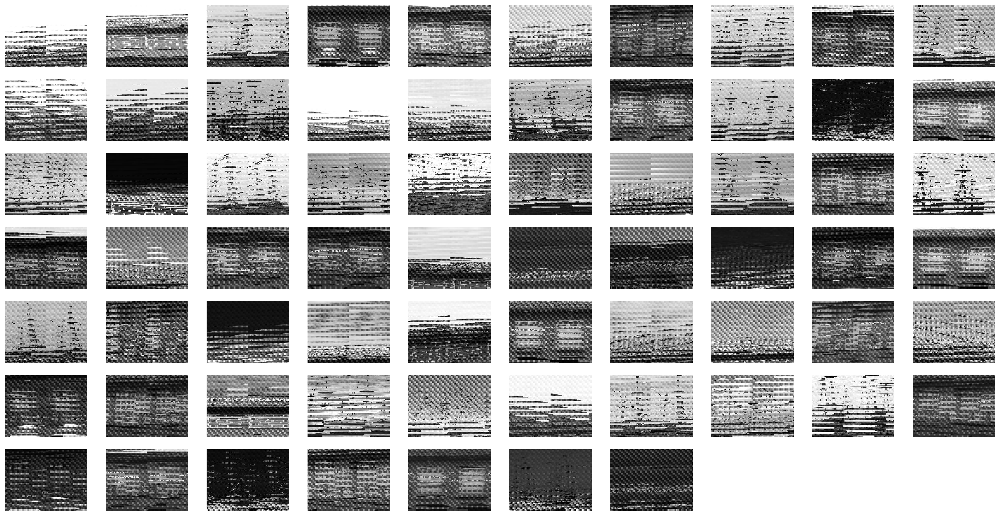

In [13]:
#Since we split data randomly, we have to print out the images and compare it by ourself to see the distance.
image_grid(X_train, H, W)
plt.show()

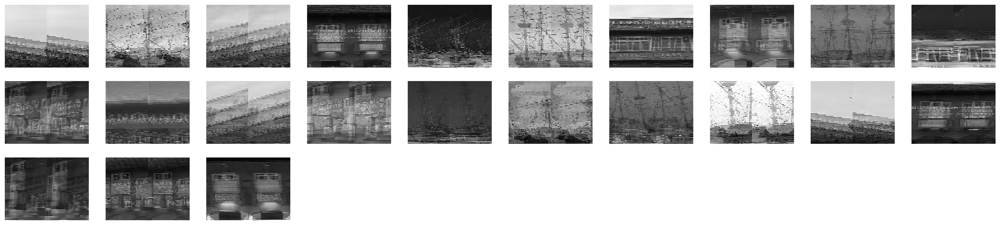

In [14]:
image_grid(X_test, H, W)
plt.show()

In [15]:
# Calculate distances

intra_class_dist = np.sum(np.power((X_train_pca[-1,:] - X_test_pca[3,:]),2))
inter_class_dist = np.sum(np.power((X_train_pca[-1,:] - X_test_pca[2,:]),2))
print("Intra-class distance: %d" % (intra_class_dist))
print("Inter-class distance: %d" % (inter_class_dist))

# Image of their own is intra class distance
# Image that not belong to them is interclass distance
# The smallest distance means that the image belong to that particular class.

# Intra class smaller the better
# Inter class larger the better

Intra-class distance: 13
Inter-class distance: 17


# Feed SVM With Data

In [16]:
from sklearn import svm

## Train the model with the parameters gamma=0.001 and C=100.

clf = svm.SVC(gamma=0.001, C=100)
clf.fit(X_train_pca,y_train)

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

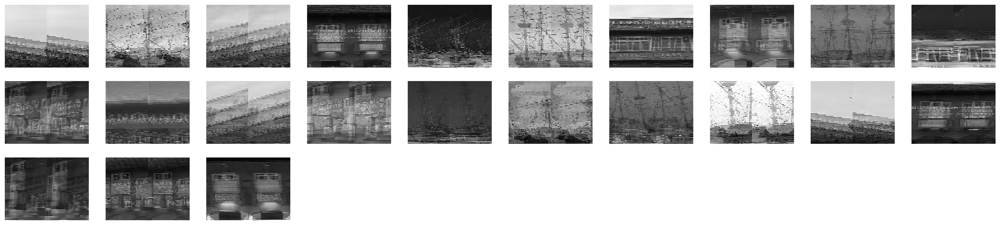

In [17]:
image_grid(X_test, H, W)
plt.show()

In [18]:
predictions=clf.predict(X_test_pca)
print(clf.predict(X_test_pca))
#0=Maritime Museum
#1=Melaka UMNO Museum
#2=Malaysia Youth Museum
    

[1 0 1 2 0 0 1 2 0 1 2 1 1 2 0 0 0 1 1 2 2 2 2]


(3.0, 0.0)

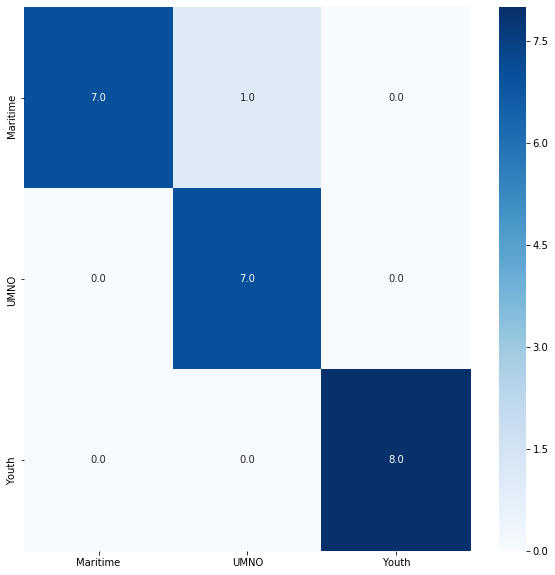

In [19]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
#print(confusion_matrix(y_test, predictions))
plt.subplots(figsize=(10,10))
cm=confusion_matrix(y_test, predictions)
categories=['Maritime','UMNO','Youth']
ax=sns.heatmap(cm,annot=True,cmap='Blues',xticklabels=categories,yticklabels=categories,fmt=".1f")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [20]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       1.00      0.88      0.93         8
           1       0.88      1.00      0.93         7
           2       1.00      1.00      1.00         8

    accuracy                           0.96        23
   macro avg       0.96      0.96      0.96        23
weighted avg       0.96      0.96      0.96        23

